In [1]:
import os, sys, time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import MERFISH_probe_design.IO.file_io as fio
import MERFISH_probe_design.probe_design.probe_dict as p_d
import MERFISH_probe_design.probe_design.OTTable_dict as ot
import MERFISH_probe_design.probe_design.readout_sequences as rs
import MERFISH_probe_design.probe_design.probe_selection as ps
import MERFISH_probe_design.probe_design.quality_check as qc
from MERFISH_probe_design.probe_design import filters
from MERFISH_probe_design.probe_design import plot
from MERFISH_probe_design.probe_design import primer_design

In [ ]:
# Define all the input files you need in this script
transcripts_fasta_file = 'temporary_data/gencode.v49.transcripts_plus_tRNA.fa' 
gencode_annotation_file = 'temporary_data/gencode.v49.annotation.gtf'
target_genes_file = 'temporary_data/tf_genes_for_merfish.csv'
transcript_exp_level_file = 'temporary_data/GTEx_Analysis_2025-08-22_v11_RSEMv1.3.3_transcripts_tpm.max_exp.csv'

In [3]:
def load_mane_select_by_gene(gtf_path):
    """
    Parse a GENCODE GTF file and return a mapping:
        gene_name -> MANE_Select transcript_id

    Parameters
    ----------
    gtf_path : str
        Path to a GENCODE GTF file (e.g. gencode.v49.annotation.gtf)

    Returns
    -------
    dict
        {gene_name: transcript_id}
    """

    def parse_attributes(attr_str):
        attrs = {}
        for item in attr_str.strip().split(";"):
            if item.strip():
                key, value = item.strip().split(" ", 1)
                attrs[key] = value.strip('"')
        return attrs

    mane_by_gene = {}

    with open(gtf_path) as f:
        for line in f:
            if line.startswith("#"):
                continue

            fields = line.rstrip("\n").split("\t")
            if len(fields) != 9:
                continue

            _, _, feature, _, _, _, _, _, attrs = fields

            # Only transcript entries
            if feature != "transcript":
                continue

            # Must be MANE Select
            if 'tag "MANE_Select"' not in attrs:
                continue

            attr_dict = parse_attributes(attrs)

            gene_name = attr_dict.get("gene_name")
            transcript_id = attr_dict.get("transcript_id")

            if gene_name and transcript_id:
                mane_by_gene[gene_name] = transcript_id

    return mane_by_gene


In [12]:
mane_by_gene_map = load_mane_select_by_gene(gencode_annotation_file)
gene_prop_df = pd.DataFrame({'gene_name' : list(mane_by_gene_map.keys())}).set_index('gene_name')
gene_prop_df['mane_transcript'] = gene_prop_df.index.map(mane_by_gene_map)
gene_prop_df['mane_transcript_version_free'] = [g.split('.')[0] for g in gene_prop_df['mane_transcript']]

gene_prop_df

,mane_transcript,mane_transcript_version_free
gene_name,,
OR4F5,ENST00000641515.2,ENST00000641515
OR4F29,ENST00000426406.4,ENST00000426406
OR4F16,ENST00000332831.5,ENST00000332831
SAMD11,ENST00000616016.5,ENST00000616016
NOC2L,ENST00000327044.7,ENST00000327044
...,...,...
BPY2B,ENST00000382392.5,ENST00000382392
DAZ3,ENST00000382365.7,ENST00000382365
DAZ4,ENST00000682740.1,ENST00000682740


In [5]:
# Load the transcriptome
transcriptome = fio.load_transcriptome(transcripts_fasta_file, None, style='gencode')
transcriptome

Loaded 534391 transcripts.
return gencode style transcriptome
{'transcript_id': 'ENST00000832824.1', 'gene_id': 'ENSG00000290825.2', 'havana_gene': '-', 'havana_transcript': '-', 'transcript_name': 'DDX11L16-260', 'gene_name': 'DDX11L16', 'length': '1379', 'transcript_type': 'lncRNA'}


,transcript_id,gene_id,havana_gene,havana_transcript,transcript_name,gene_short_name,length,transcript_type,sequence,FPKM
0,ENST00000832824.1,ENSG00000290825.2,-,-,DDX11L16-260,DDX11L16,1379,lncRNA,CGCAGAGACGGGTAGAACCTCAGTAATCCGAAAAGCCGGGATCGAC...,1
1,ENST00000832825.1,ENSG00000290825.2,-,-,DDX11L16-261,DDX11L16,1417,lncRNA,GAGACGGGTAGAACCTCAGTAATCCGAAAAGCCGGGATCGACCGCC...,1
2,ENST00000832826.1,ENSG00000290825.2,-,-,DDX11L16-262,DDX11L16,1538,lncRNA,CCTGCTGGCAGCTGGGGACACTGCCGGGCCCTCTTGCTCCAACAGT...,1
3,ENST00000832827.1,ENSG00000290825.2,-,-,DDX11L16-263,DDX11L16,1519,lncRNA,CTGCTGGCAGCTGGGGACACTGCCGGGCCCTCTTGCTCCAACAGTA...,1
4,ENST00000832828.1,ENSG00000290825.2,-,-,DDX11L16-264,DDX11L16,1762,lncRNA,GACACTGCCGGGCCCTCTTGCTCCAACAGTACTGGCGGATTATAGG...,1
...,...,...,...,...,...,...,...,...,...,...
534386,TRNST00020088.1,TRNSG00020088.1,-,-,20088,20088,75,tRNA,TGTTAATGAGAGGAGTTGAACCTCTGATTATAAAGTTTTAAGTCTT...,1
534387,TRNST00035969.1,TRNSG00035969.1,-,-,35969,35969,75,tRNA,CTCTAGAATATAGGAATTGAACCTGCACCTGAGAATCCAAAATTCT...,1
534388,TRNST00026266.1,TRNSG00026266.1,-,-,26266,26266,75,tRNA,GTTAAGATGGCAGAGCCCGGTAATCGCATAAAACTTAAAACTTTAC...,1
534389,TRNST00032170.1,TRNSG00032170.1,-,-,32170,32170,74,tRNA,CGTCCTTGGGTGGTCTCGAACCACCAACCTTCCGGTTAACAGCCGA...,1


<Axes: >

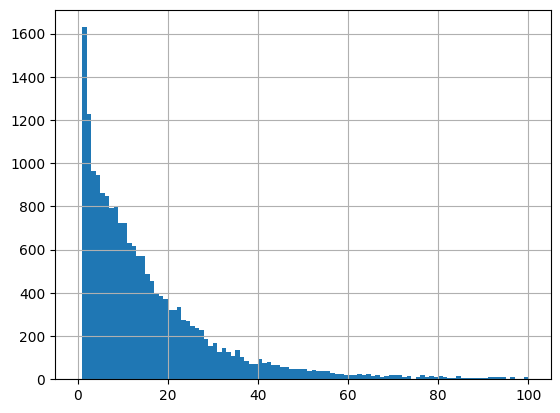

In [13]:
# Count the number of transcripts for each gene
gene_prop_df['transcript_count'] = transcriptome['gene_short_name'].value_counts()
gene_prop_df['transcript_count'].hist(range=(0, 100), bins=100)

In [10]:
# Load the expression level of genes into the transcriptome
transcriptome['transcript_id_version_free'] = [g.split('.')[0] for g in transcriptome['transcript_id']]

transcript_exp_df = pd.read_csv(transcript_exp_level_file, index_col=0)

# Use the max expression level of a transcript across all samples as the expression level of the transcript
transcript_exp_map = {t.split('.')[0] : transcript_exp_df.loc[t, 'exp'] for t in transcript_exp_df.index}
transcriptome['FPKM'] = transcriptome['transcript_id_version_free'].map(transcript_exp_map)
transcriptome['FPKM'] = transcriptome['FPKM'].fillna(1)

transcriptome

,transcript_id,gene_id,havana_gene,havana_transcript,transcript_name,gene_short_name,length,transcript_type,sequence,FPKM,transcript_id_version_free
0,ENST00000832824.1,ENSG00000290825.2,-,-,DDX11L16-260,DDX11L16,1379,lncRNA,CGCAGAGACGGGTAGAACCTCAGTAATCCGAAAAGCCGGGATCGAC...,0.69,ENST00000832824
1,ENST00000832825.1,ENSG00000290825.2,-,-,DDX11L16-261,DDX11L16,1417,lncRNA,GAGACGGGTAGAACCTCAGTAATCCGAAAAGCCGGGATCGACCGCC...,0.77,ENST00000832825
2,ENST00000832826.1,ENSG00000290825.2,-,-,DDX11L16-262,DDX11L16,1538,lncRNA,CCTGCTGGCAGCTGGGGACACTGCCGGGCCCTCTTGCTCCAACAGT...,0.90,ENST00000832826
3,ENST00000832827.1,ENSG00000290825.2,-,-,DDX11L16-263,DDX11L16,1519,lncRNA,CTGCTGGCAGCTGGGGACACTGCCGGGCCCTCTTGCTCCAACAGTA...,0.34,ENST00000832827
4,ENST00000832828.1,ENSG00000290825.2,-,-,DDX11L16-264,DDX11L16,1762,lncRNA,GACACTGCCGGGCCCTCTTGCTCCAACAGTACTGGCGGATTATAGG...,0.83,ENST00000832828
...,...,...,...,...,...,...,...,...,...,...,...
534386,TRNST00020088.1,TRNSG00020088.1,-,-,20088,20088,75,tRNA,TGTTAATGAGAGGAGTTGAACCTCTGATTATAAAGTTTTAAGTCTT...,1.00,TRNST00020088
534387,TRNST00035969.1,TRNSG00035969.1,-,-,35969,35969,75,tRNA,CTCTAGAATATAGGAATTGAACCTGCACCTGAGAATCCAAAATTCT...,1.00,TRNST00035969
534388,TRNST00026266.1,TRNSG00026266.1,-,-,26266,26266,75,tRNA,GTTAAGATGGCAGAGCCCGGTAATCGCATAAAACTTAAAACTTTAC...,1.00,TRNST00026266
534389,TRNST00032170.1,TRNSG00032170.1,-,-,32170,32170,74,tRNA,CGTCCTTGGGTGGTCTCGAACCACCAACCTTCCGGTTAACAGCCGA...,1.00,TRNST00032170


<Axes: >

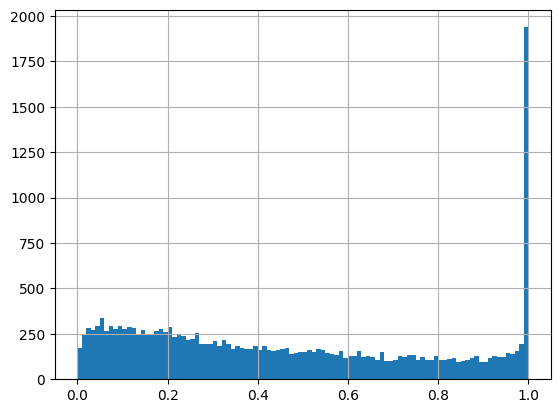

In [21]:
# Get the relative expression levels of the MANE SELECT transcript
gene_prop_df['mane_transcript_exp'] = gene_prop_df['mane_transcript_version_free'].map(transcript_exp_map)
gene_prop_df['gene_total_exp'] = transcriptome.groupby('gene_short_name')['FPKM'].sum()
gene_prop_df['mane_transcript_relative_exp'] = gene_prop_df['mane_transcript_exp'] / gene_prop_df['gene_total_exp']
gene_prop_df['mane_transcript_relative_exp'].hist(bins=100)

In [25]:
# Initialize the probe dictionary which is the carrier of the probes throught the design process.
transcriptome_mane = transcriptome[transcriptome['transcript_id_version_free'].isin(gene_prop_df['mane_transcript_version_free'])].copy()

probe_dict = p_d.init_probe_dict(list(gene_prop_df.index), 
                                 transcriptome_mane, 
                                 'gene_short_name', K=30)

p_d.print_probe_dict(probe_dict)

Found 19276 transcripts for 19276 target genes.
Gene	Transcript	N_probes
OR4F5
	ENST00000641515.2	2589
OR4F29
	ENST00000426406.4	910
OR4F16
	ENST00000332831.5	910
SAMD11
	ENST00000616016.5	3436
NOC2L
	ENST00000327044.7	2728
KLHL17
	ENST00000338591.8	2538
PLEKHN1
	ENST00000379410.8	3147
PERM1
	ENST00000433179.4	3491
HES4
	ENST00000304952.11	856
ISG15
	ENST00000649529.1	608
AGRN
	ENST00000379370.7	7297
RNF223
	ENST00000453464.3	1871
C1orf159
	ENST00000421241.7	1803
TTLL10
	ENST00000379289.6	2259
TNFRSF18
	ENST00000379268.7	1054
TNFRSF4
	ENST00000379236.4	1046
SDF4
	ENST00000360001.12	1904
B3GALT6
	ENST00000379198.5	2776
C1QTNF12
	ENST00000330388.2	1007
UBE2J2
	ENST00000349431.11	2231
SCNN1D
	ENST00000379116.10	3021
ACAP3
	ENST00000354700.10	3764
PUSL1
	ENST00000379031.10	1228
INTS11
	ENST00000435064.6	2085
CPTP
	ENST00000343938.9	2125
TAS1R3
	ENST00000339381.6	3446
DVL1
	ENST00000378888.10	3276
MXRA8
	ENST00000309212.11	2264
AURKAIP1
	ENST00000338338.10	724
CCNL2
	ENST00000400809.8	3083


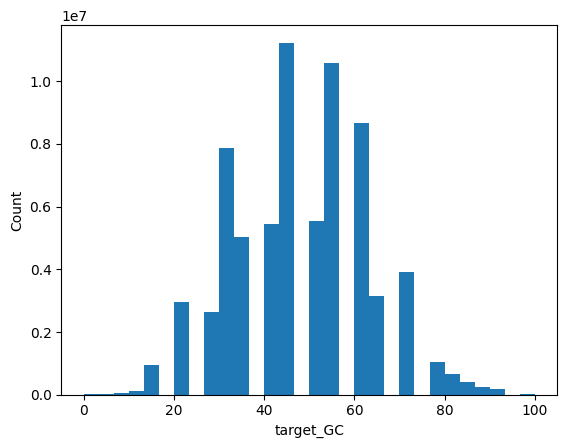

In [26]:
# Calculate and plot the GC contents of the target regions
filters.calc_gc_for_probe_dict(probe_dict, column_key_seq='target_sequence', column_key_write='target_GC')
plot.plot_hist(probe_dict, column_key='target_GC')

OR4F5
	ENST00000641515.2: 812 / 2589 probes passed the filter 40 < target_GC <  70.
OR4F29
	ENST00000426406.4: 639 / 910 probes passed the filter 40 < target_GC <  70.
OR4F16
	ENST00000332831.5: 639 / 910 probes passed the filter 40 < target_GC <  70.
SAMD11
	ENST00000616016.5: 1267 / 3436 probes passed the filter 40 < target_GC <  70.
NOC2L
	ENST00000327044.7: 2068 / 2728 probes passed the filter 40 < target_GC <  70.
KLHL17
	ENST00000338591.8: 1601 / 2538 probes passed the filter 40 < target_GC <  70.
PLEKHN1
	ENST00000379410.8: 1834 / 3147 probes passed the filter 40 < target_GC <  70.
PERM1
	ENST00000433179.4: 1946 / 3491 probes passed the filter 40 < target_GC <  70.
HES4
	ENST00000304952.11: 204 / 856 probes passed the filter 40 < target_GC <  70.
ISG15
	ENST00000649529.1: 397 / 608 probes passed the filter 40 < target_GC <  70.
AGRN
	ENST00000379370.7: 3550 / 7297 probes passed the filter 40 < target_GC <  70.
RNF223
	ENST00000453464.3: 1014 / 1871 probes passed the filter 40 < 

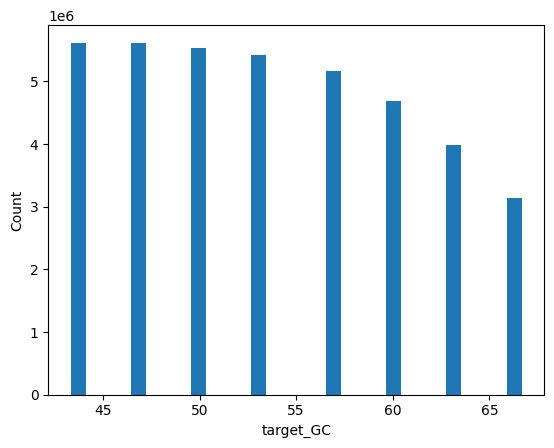

In [27]:
# Filter GC cotent and plot the GC content after filtering
filters.filter_probe_dict_by_metric(probe_dict, 'target_GC', lower_bound=40, upper_bound=70)
plot.plot_hist(probe_dict, column_key='target_GC', bins=30)

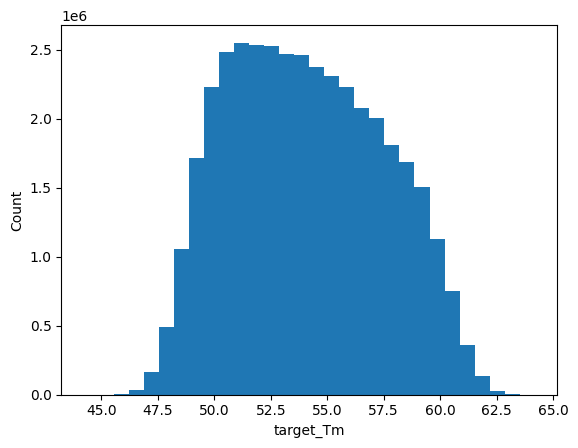

In [28]:
# Calculate and plot the melting-temperatures (Tm)
filters.calc_tm_for_probe_dict(probe_dict, Na_conc=390, fmd_percentile=30, 
                               probe_conc=5,
                               column_key_seq='target_sequence', 
                               column_key_write='target_Tm')
plot.plot_hist(probe_dict, column_key='target_Tm')

OR4F5
	ENST00000641515.2: 546 / 812 probes passed the filter 50 < target_Tm <  65.
OR4F29
	ENST00000426406.4: 525 / 639 probes passed the filter 50 < target_Tm <  65.
OR4F16
	ENST00000332831.5: 525 / 639 probes passed the filter 50 < target_Tm <  65.
SAMD11
	ENST00000616016.5: 1251 / 1267 probes passed the filter 50 < target_Tm <  65.
NOC2L
	ENST00000327044.7: 2025 / 2068 probes passed the filter 50 < target_Tm <  65.
KLHL17
	ENST00000338591.8: 1592 / 1601 probes passed the filter 50 < target_Tm <  65.
PLEKHN1
	ENST00000379410.8: 1792 / 1834 probes passed the filter 50 < target_Tm <  65.
PERM1
	ENST00000433179.4: 1916 / 1946 probes passed the filter 50 < target_Tm <  65.
HES4
	ENST00000304952.11: 203 / 204 probes passed the filter 50 < target_Tm <  65.
ISG15
	ENST00000649529.1: 396 / 397 probes passed the filter 50 < target_Tm <  65.
AGRN
	ENST00000379370.7: 3527 / 3550 probes passed the filter 50 < target_Tm <  65.
RNF223
	ENST00000453464.3: 1002 / 1014 probes passed the filter 50 < t

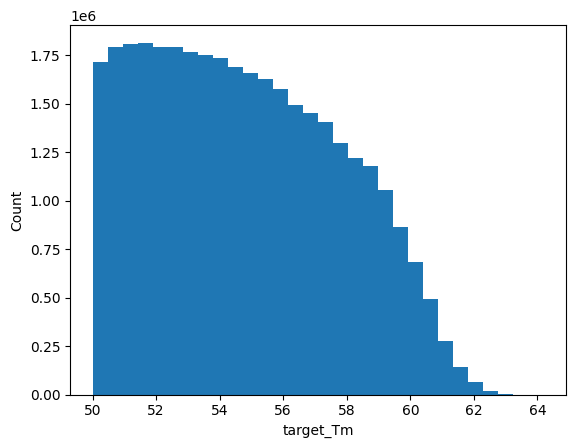

In [29]:
# Filter by Tm
# NOTE: here we used a higher upper bound for GC content and Tm than JM's original
# cutoffs. It was shown that higher Tm gives better signal-to-noise ratios in SM-FISH
filters.filter_probe_dict_by_metric(probe_dict, 'target_Tm', 
                                    lower_bound=50, upper_bound=65)
plot.plot_hist(probe_dict, column_key='target_Tm')

In [30]:
# Initialize the off-target counting tables
overwrite_ottable = True
# OTTable for rRNA/tRNAs
if 'ottable_rtRNAs' not in locals() or overwrite_ottable:
    #ncRNAs =  fio.load_fasta_into_df(ncRNA_fasta_file)
    ottable_rtRNAs = ot.get_OTTable_for_rtRNAs(transcriptome, 15, search_column='transcript_type')

Found 746 rRNAs/tRNAs from 534391 non-coding RNAs.


In [31]:
# OTTables for the genes we target
if 'gene_ottable_dict' not in locals() or overwrite_ottable:
    #gene_ottable_dict = ot.get_gene_OTTables(transcriptome, sel_isoform_names, 'transcript_id', 17)
    gene_ottable_dict = ot.get_gene_OTTables(transcriptome, list(gene_prop_df.index), 'gene_short_name', 17)

Generate OTTable for gene OR4F5.
Construct a OTTable using 1/1 transcripts with FPKM > 0.
Generate OTTable for gene OR4F29.
Construct a OTTable using 1/1 transcripts with FPKM > 0.
Generate OTTable for gene OR4F16.
Construct a OTTable using 1/1 transcripts with FPKM > 0.
Generate OTTable for gene SAMD11.
Construct a OTTable using 18/18 transcripts with FPKM > 0.
Generate OTTable for gene NOC2L.
Construct a OTTable using 69/69 transcripts with FPKM > 0.
Generate OTTable for gene KLHL17.
Construct a OTTable using 10/10 transcripts with FPKM > 0.
Generate OTTable for gene PLEKHN1.
Construct a OTTable using 12/12 transcripts with FPKM > 0.
Generate OTTable for gene PERM1.
Construct a OTTable using 12/12 transcripts with FPKM > 0.
Generate OTTable for gene HES4.
Construct a OTTable using 5/5 transcripts with FPKM > 0.
Generate OTTable for gene ISG15.
Construct a OTTable using 4/4 transcripts with FPKM > 0.
Generate OTTable for gene AGRN.
Construct a OTTable using 10/10 transcripts with FPKM

In [32]:
# OTTable for the transcriptome.
if 'ottable_transcriptome' not in locals() or overwrite_ottable:
    ottable_transcriptome = ot.get_OTTable_for_transcriptome(transcriptome, 17)

Construct a OTTable using 529092/534391 transcripts with FPKM > 0.
Processed 100000/529092 sequences.
Processed 200000/529092 sequences.
Processed 300000/529092 sequences.
Processed 400000/529092 sequences.
Processed 500000/529092 sequences.


Calculate OTs for 0/19276 genes.
Calculate OTs for 192/19276 genes.
Calculate OTs for 384/19276 genes.
Calculate OTs for 576/19276 genes.
Calculate OTs for 768/19276 genes.
Calculate OTs for 960/19276 genes.
Calculate OTs for 1152/19276 genes.
Calculate OTs for 1344/19276 genes.
Calculate OTs for 1536/19276 genes.
Calculate OTs for 1728/19276 genes.
Calculate OTs for 1920/19276 genes.
Calculate OTs for 2112/19276 genes.
Calculate OTs for 2304/19276 genes.
Calculate OTs for 2496/19276 genes.
Calculate OTs for 2688/19276 genes.
Calculate OTs for 2880/19276 genes.
Calculate OTs for 3072/19276 genes.
Calculate OTs for 3264/19276 genes.
Calculate OTs for 3456/19276 genes.
Calculate OTs for 3648/19276 genes.
Calculate OTs for 3840/19276 genes.
Calculate OTs for 4032/19276 genes.
Calculate OTs for 4224/19276 genes.
Calculate OTs for 4416/19276 genes.
Calculate OTs for 4608/19276 genes.
Calculate OTs for 4800/19276 genes.
Calculate OTs for 4992/19276 genes.
Calculate OTs for 5184/19276 genes.


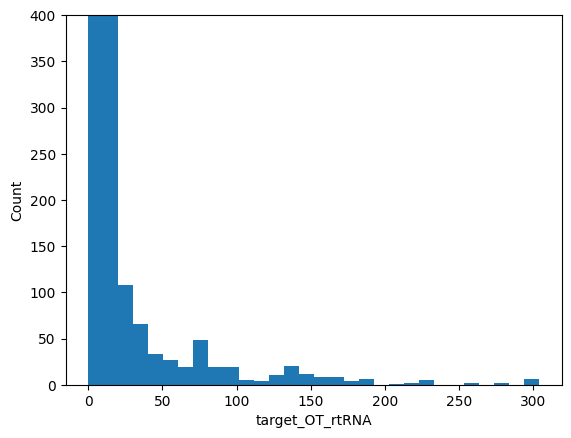

OR4F5
	ENST00000641515.2: 546 / 546 probes passed the filter -inf < target_OT_rtRNA <  0.5.
OR4F29
	ENST00000426406.4: 525 / 525 probes passed the filter -inf < target_OT_rtRNA <  0.5.
OR4F16
	ENST00000332831.5: 525 / 525 probes passed the filter -inf < target_OT_rtRNA <  0.5.
SAMD11
	ENST00000616016.5: 1251 / 1251 probes passed the filter -inf < target_OT_rtRNA <  0.5.
NOC2L
	ENST00000327044.7: 2025 / 2025 probes passed the filter -inf < target_OT_rtRNA <  0.5.
KLHL17
	ENST00000338591.8: 1592 / 1592 probes passed the filter -inf < target_OT_rtRNA <  0.5.
PLEKHN1
	ENST00000379410.8: 1792 / 1792 probes passed the filter -inf < target_OT_rtRNA <  0.5.
PERM1
	ENST00000433179.4: 1916 / 1916 probes passed the filter -inf < target_OT_rtRNA <  0.5.
HES4
	ENST00000304952.11: 203 / 203 probes passed the filter -inf < target_OT_rtRNA <  0.5.
ISG15
	ENST00000649529.1: 396 / 396 probes passed the filter -inf < target_OT_rtRNA <  0.5.
AGRN
	ENST00000379370.7: 3527 / 3527 probes passed the filter -i

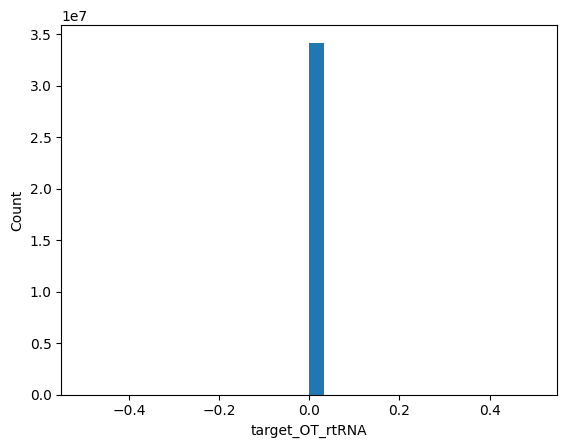

In [33]:
# Calculate and plot the off-targets to rRNA/tRNAs
ot.calc_OTs(probe_dict, ottable_rtRNAs, 'target_sequence', 'target_OT_rtRNA', 15)
plot.plot_hist(probe_dict, 'target_OT_rtRNA', y_max=400)
# Filter out probes that have any rRNA/tRNA off-targets
filters.filter_probe_dict_by_metric(probe_dict, 'target_OT_rtRNA', upper_bound=0.5)
plot.plot_hist(probe_dict, 'target_OT_rtRNA')

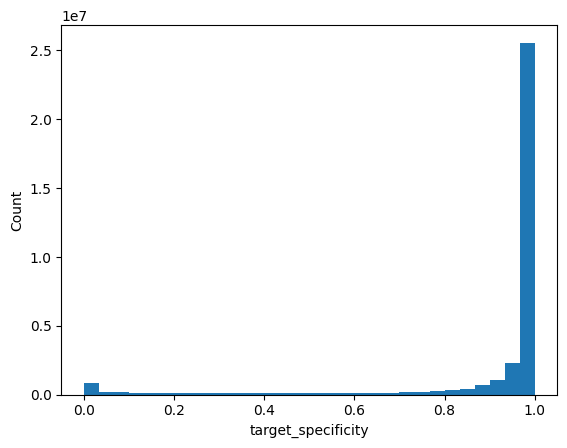

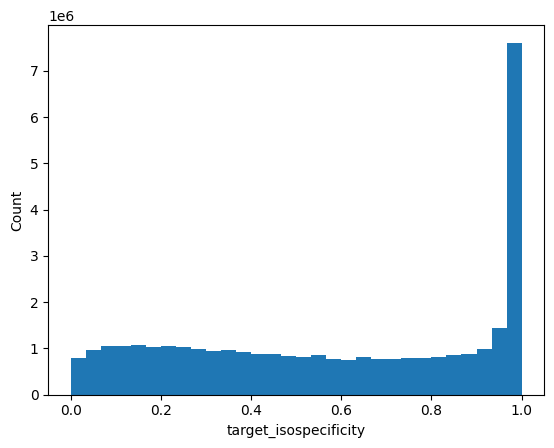

In [34]:
# Get the FPKMs of the transcripts
transcript_fpkms = dict(zip(list(transcriptome['transcript_id']), list(transcriptome['FPKM'])))

# Calculate the specificities and isoform specificities of the target regions
ot.calc_specificity(probe_dict, ottable_transcriptome, gene_ottable_dict, transcript_fpkms,
                    'target_sequence', 'target_specificity', 'target_isospecificity', 17)

plot.plot_hist(probe_dict, 'target_specificity')
plot.plot_hist(probe_dict, 'target_isospecificity')

OR4F5
	ENST00000641515.2: 22 / 546 probes passed the filter 0.999 < target_specificity <  inf.
OR4F29
	ENST00000426406.4: 0 / 525 probes passed the filter 0.999 < target_specificity <  inf.
OR4F16
	ENST00000332831.5: 0 / 525 probes passed the filter 0.999 < target_specificity <  inf.
SAMD11
	ENST00000616016.5: 853 / 1251 probes passed the filter 0.999 < target_specificity <  inf.
NOC2L
	ENST00000327044.7: 361 / 2025 probes passed the filter 0.999 < target_specificity <  inf.
KLHL17
	ENST00000338591.8: 1104 / 1592 probes passed the filter 0.999 < target_specificity <  inf.
PLEKHN1
	ENST00000379410.8: 1239 / 1792 probes passed the filter 0.999 < target_specificity <  inf.
PERM1
	ENST00000433179.4: 1442 / 1916 probes passed the filter 0.999 < target_specificity <  inf.
HES4
	ENST00000304952.11: 140 / 203 probes passed the filter 0.999 < target_specificity <  inf.
ISG15
	ENST00000649529.1: 348 / 396 probes passed the filter 0.999 < target_specificity <  inf.
AGRN
	ENST00000379370.7: 2484 /

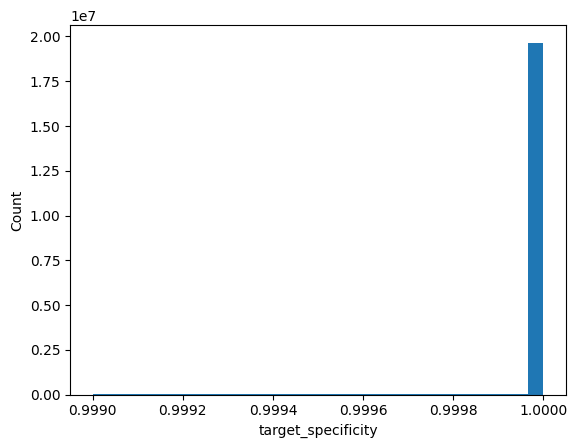

In [35]:
# Strictly prohibit off-target to different genes
filters.filter_probe_dict_by_metric(probe_dict, 'target_specificity', lower_bound=0.999)
plot.plot_hist(probe_dict, 'target_specificity')

,transcript,n_probes,n_max_no_overlap_probes
gene,,,
OR4F5,ENST00000641515.2,22,2
OR4F29,ENST00000426406.4,0,0
OR4F16,ENST00000332831.5,0,0
SAMD11,ENST00000616016.5,853,58
NOC2L,ENST00000327044.7,361,35
...,...,...,...
BPY2B,ENST00000382392.5,0,0
DAZ3,ENST00000382365.7,0,0
DAZ4,ENST00000682740.1,0,0


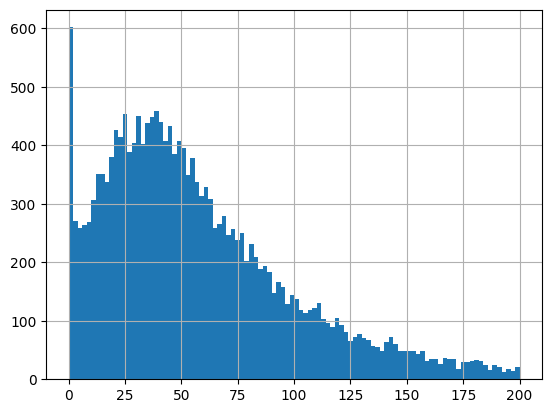

In [ ]:
# Count the max number of non-overlapping probes
max_non_overlapping_probes_count_df = ps.count_max_non_overlapping_probes(probe_dict)
max_non_overlapping_probes_count_df = max_non_overlapping_probes_count_df.set_index('gene')

max_non_overlapping_probes_count_df['n_max_no_overlap_probes'].hist(bins=100, range=(0, 200))
max_non_overlapping_probes_count_df

In [ ]:
gene_prop_df['n_specific_probes'] = max_non_overlapping_probes_count_df['n_probes']
gene_prop_df['n_max_no_overlap_specific_probes'] = max_non_overlapping_probes_count_df['n_max_no_overlap_probes']
gene_prop_df.to_csv('temporary_data/human_gene_MERFISH_targetability.csv')
gene_prop_df

,mane_transcript,mane_transcript_version_free,transcript_count,mane_transcript_exp,gene_total_exp,mane_transcript_relative_exp,n_specific_probes,n_max_no_overlap_specific_probes
gene_name,,,,,,,,
OR4F5,ENST00000641515.2,ENST00000641515,1,1.00,1.00,1.000000,22,2
OR4F29,ENST00000426406.4,ENST00000426406,1,1.09,1.09,1.000000,0,0
OR4F16,ENST00000332831.5,ENST00000332831,1,1.09,1.09,1.000000,0,0
SAMD11,ENST00000616016.5,ENST00000616016,18,5.12,243.97,0.020986,853,58
NOC2L,ENST00000327044.7,ENST00000327044,69,113.49,291.02,0.389973,361,35
...,...,...,...,...,...,...,...,...
BPY2B,ENST00000382392.5,ENST00000382392,4,3.46,8.73,0.396334,0,0
DAZ3,ENST00000382365.7,ENST00000382365,5,20.04,201.43,0.099489,0,0
DAZ4,ENST00000682740.1,ENST00000682740,8,2.22,38.57,0.057558,0,0
